# Preprocessing Importance on Classification:
Preprocessing is a central part in any Natural Language Processing task. In order to extract relevant information from data, it is extremely important to process it. This preprocess task usually includes using methods such as tokenization, lowercasing, stemming, lemmatization, removing stopwords and part-of-speech filtering.

In this notebook, we will use the dataset "Amazon Fine Food Reviews" from Kaggle (https://www.kaggle.com/snap/amazon-fine-food-reviews). "This dataset consists of reviews of fine foods from amazon. The data span a period of more than 10 years, including all ~500,000 reviews up to October 2012. Reviews include product and user information, ratings, and a plain text review. It also includes reviews from all other Amazon categories."

We have already made the train/test split for you with 75000 examples for training and 5000 for testing. The train and test corpus labels are scores from 1-5 with 1 meaning the review is bad/negative and 5 meaning the review is good/positive, thereby the goal is to create a very simple classifier that predicts a review score.

#### Note:
The major goal for this notebook is for you to understand well all the preprocessing steps requiered for working with text! 

# 1 - Data Import

In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [94]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [95]:
df_train.head(15)

,text,label
0,$BYND - JPMorgan reels in expectations on Beyo...,0
1,$CCL $RCL - Nomura points to bookings weakness...,0
2,"$CX - Cemex cut at Credit Suisse, J.P. Morgan ...",0
3,$ESS: BTIG Research cuts to Neutral https://t....,0
4,$FNKO - Funko slides after Piper Jaffray PT cu...,0
5,$FTI - TechnipFMC downgraded at Berenberg but ...,0
6,$GM - GM loses a bull https://t.co/tdUfG5HbXy,0
7,$GM: Deutsche Bank cuts to Hold https://t.co/7...,0
8,$GTT: Cowen cuts to Market Perform,0
9,$HNHAF $HNHPD $AAPL - Trendforce cuts iPhone e...,0


In [96]:
df_train[79:89]

,text,label
79,Kohl's stock price target cut to $48 from $52 ...,0
80,Kohl's stock price target cut to $50 from $53 ...,0
81,L Brands stock price target cut to $16 from $2...,0
82,Lovesac stock price target cut to $28 vs. $33 ...,0
83,Lyft stock price target cut to $58 from $70 at...,0
84,Macerich downgraded to underweight from sector...,0
85,Marinus Pharma stock price target cut to $6 fr...,0
86,Methanex downgraded at TD Securities on valuation,0
87,Metro Inc. Just Missed Earnings And Its EPS Lo...,0
88,Mid-America Apartment Communities downgraded t...,0


# 2 - Exploratory Analysis

## 2.1. Score (Dependent feature)

In [97]:
(df_train['label']).median()

2.0

In [98]:
unique, counts = np.unique(df_train['label'], return_counts=True)
dict(zip(unique, counts))

{0: 1442, 1: 1923, 2: 6178}

The neutral label has a lot more data than the other two. So it could probably benefit the results if we under or oversample this data. We will try this in the end, using the model that shows the best results to see if we can improve them.

In [99]:
df_train['label'].describe()

count    9543.000000
mean        1.496280
std         0.743139
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         2.000000
Name: label, dtype: float64

<AxesSubplot: >

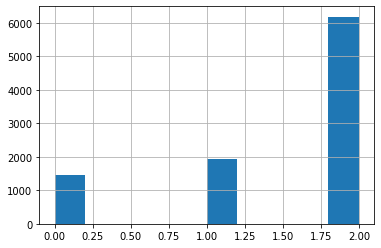

In [100]:
df_train['label'].hist() #This is very important! Fazer isto no trabalho
#Because most are positive, the negative ones will be harder to predict.
#So general rule: if on class is very represented, then the model will be good predicting
#those classes but bad for under represented ones

<AxesSubplot: >

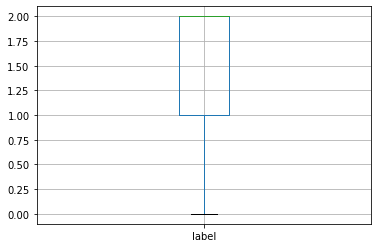

In [101]:
df_train.boxplot(['label'])
#Kind of skewed

In [102]:
#check if there are any null values
df_train['label'].isna().sum()

0

## 2.2. Text (Independent features)

In [103]:
df_train['text'][10]

"$HOG - Moody's warns on Harley-Davidson https://t.co/LurHBEadeU"

In [104]:
df_train.isna().sum()

text     0
label    0
dtype: int64

### Observations:
We can see that there are no missing values and that the texts may contain links and tickers.


### Word Count

In [105]:
# Fetch wordcount for each abstract
df_train['word_count']  = df_train['text'].apply(lambda x: len(str(x).split(" ")))
df_train[['text','word_count']].head()

#maybe check if long reviews or short reviews have a tendency to be better or worse

,text,word_count
0,$BYND - JPMorgan reels in expectations on Beyo...,10
1,$CCL $RCL - Nomura points to bookings weakness...,14
2,"$CX - Cemex cut at Credit Suisse, J.P. Morgan ...",14
3,$ESS: BTIG Research cuts to Neutral https://t....,7
4,$FNKO - Funko slides after Piper Jaffray PT cu...,10


### Descriptive Statistics of word count

In [106]:
df_train.word_count.describe()

count    9543.000000
mean       12.168081
std         4.651245
min         1.000000
25%         9.000000
50%        11.000000
75%        15.000000
max        31.000000
Name: word_count, dtype: float64

<AxesSubplot: >

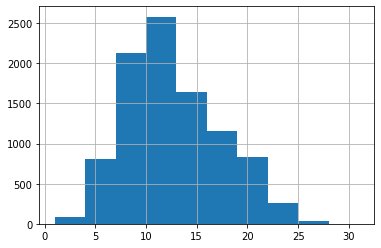

In [107]:
df_train['word_count'].hist()

In [108]:
all_words = ' '.join(df_train['text']).split()# has all the words in the corpus

### Word Statistics

In [109]:
freq = pd.Series(all_words).value_counts()

In [110]:
freq.sort_values(ascending=False)[0:10]#these are the stop words. they have the least importance because
#they appear the most.
#We define our stop words

to     2332
the    1820
of     1464
-      1390
in     1361
on     1136
for    1032
a       970
and     898
The     663
dtype: int64

In [111]:
freq.index[0:10]

Index(['to', 'the', 'of', '-', 'in', 'on', 'for', 'a', 'and', 'The'], dtype='object')

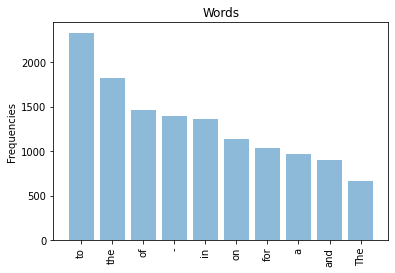

In [112]:
x_labels = freq.index[0:10]
values = freq[:10]
plt.bar(x_labels, values, align='center', alpha=0.5)
#plt.xticks(y_pos, x_labels)
plt.ylabel('Frequencies')
plt.title('Words')
plt.xticks(rotation=90)
plt.show()
#this is the end of the exploratory analysis for the dependent variables

### Ticker Count

In [113]:
import re
tickers = []
for word in all_words:
    if(re.findall(r'[$][A-Za-z][\S]*', word) != []):
        tickers.append(word)
print('Number of tickers found:',len(tickers))
print(tickers)


Number of tickers found: 2027
['$BYND', '$CCL', '$RCL', '$CX', '$ESS:', '$FNKO', '$FTI', '$GM', '$GM:', '$GTT:', '$HNHAF', '$HNHPD', '$AAPL', '$HOG', '$HXL', '$I', '$KRG:', '$LK', '$MANT', '$MDCO:', '$MPLX', '$MPC', '$MSGN', '$MTLS', '$NCBS:', '$NFLX', '$SHOP', '$STAY', '$TWLO', '$VCLT', '$SPLB', '$IGLB', '$VIAC', '$VIACA', '$FOX', '$VIAC:', '$XLNX', '$AEO', '$COLM', '$DGII', '$EQT', '$ESS', '$EVRG', '$GTT', '$KRG', '$MANT', '$MDCO', '$NFLX', '$OMP', '$PEG', '$PRU', '$SBT', '$SITC', '$TAP', '$VIPS', '$MLND', '$MSGN', '$MTLS', '$O', '$OC', '$OVV', '$PEB', '$PK', '$PLYA', '$QEP', '$RHP', '$RPAI', '$SAIA', '$SDC', '$SHOP', '$SKY', '$SLG', '$SM', '$TWLO…', '$NFLX', '$ALTG:', '$AMD', '$ANCUF:', '$BHE:', '$CNC', '$DE', '$EBAY', '$FCX', '$FLXN:', '$FNV', '$GBT:', '$GM', '$GOOS:', '$HAS', '$JD', '$JD:', '$KHC', '$KIM:', '$LOW', '$LRCX', '$LULU:', '$MU', '$WDC', '$NBY', '$NFLX', '$NVDA', '$OCN', '$OYST:', '$RAPT:', '$RNG', '$SBAC', '$SBAC', '$AMT', '$SNAP', '$STXS:', '$TENB', '$UBER', '$LYFT', 

### Website Link Count

In [114]:
web_links = []
for word in all_words:
    #Regex curtesy of https://stackoverflow.com/questions/6718633/python-regular-expression-again-match-url
    if(re.findall(r"((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*", word) != []):
        web_links.append(word)
print('Number of web links found:',len(web_links))
print(web_links)

Number of web links found: 5146
['https://t.co/bd0xbFGjkT', 'https://t.co/yGjpT2ReD3', 'https://t.co/KN1g4AWFIb', 'https://t.co/MCyfTsXc2N', 'https://t.co/z37IJmCQzB', 'https://t.co/XKcPDilIuU', 'https://t.co/tdUfG5HbXy', 'https://t.co/7Fv1ZiFZBS', 'https://t.co/rlnEwzlzzS', 'https://t.co/LurHBEadeU', 'https://t.co/wU5P2i8WBU', 'https://t.co/YsvsMSQRIb', 'https://t.co/MCyfTsXc2N', 'https://t.co/8yrbwAjLKG', 'https://t.co/mJ1eSrsFXJ', 'https://t.co/0BFQy4ZU6W', 'https://t.co/Ul2S6XNXw8', 'https://t.co/qlFxZuhkrt', 'https://t.co/PdPkgLk0FQ', 'https://t.co/eoq7Lchtk4', 'https://t.co/WrQXTC38nB', 'https://t.co/Ky3d8DxnjX', 'https://t.co/NKYQgy2o3J', 'https://t.co/APfxEqSSRF', 'https://t.co/7Fv1ZiFZBS', 'https://t.co/hsWCvJb1Ct', 'https://t.co/PlbSaE1Nc2', 'https://t.co/InJKourtW3', 'https://t.co/NGkYTADOSt', 'https://t.co/NhiYwphBQd', 'https://t.co/jMJ3N4A06T', 'https://t.co/vuNpYwRDSg', 'https://t.co/niUwYR5YUD', 'https://t.co/WnCksfl1gX', 'https://t.co/MfhnyZe593', 'https://t.co/1adfDkHe

### See what types of weird non-words exist in the corpus that should be removed besides weblinks and tickers

In [115]:
# get the amount of unique words
unique_words_amount = len(freq==1)
unique_words = freq.sort_values(ascending=True)[0:unique_words_amount]
possible_garbage = []
for word,frequency in unique_words.items():
    if(re.findall(r'[$][A-Za-z][\S]*', word) == [] and 
       re.findall(r"((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*", word) == []):
        if not word.isalpha():
            possible_garbage.append(word)
possible_garbage


['Foods,',
 'SPC,',
 'Plant-based',
 '#Grifols',
 'founder:',
 '$7.0',
 '‘I',
 'consolidation’',
 'Lake,',
 '#GoldONResources',
 '#Garmin',
 'Keep:',
 'Sergeant-Turned-Marketing',
 '#GalileoMining',
 'China?',
 '#GalpEnergiaSGPS',
 'giant’s',
 'E-Bike',
 '#JarvisSecurities',
 'Conditioni…',
 '#Jatenergy',
 'GS’',
 'rec…',
 'types…',
 'business,',
 '2023',
 'advertising,',
 'companies:',
 '(EPT/RI)-',
 '‘Breeze',
 'Air’',
 '$15.15M',
 'Charlotte-area',
 'buildin...…',
 '‘Launch',
 'co-invest',
 '19a-1',
 '#GuggenheimPartnersLLC',
 'H.I.G.',
 'Industrial/Flex',
 "'stark",
 "reality'",
 'pricing,',
 'Gay-themed',
 'Brides,',
 '$33.1',
 "'200K'",
 '28.6',
 'Macquarie/First',
 'Infrastructure/Utilities',
 '$0.485',
 '$184',
 'Ford’s',
 'Volumes?',
 '2045',
 "Disney+'s",
 '$380m',
 '$603.5m',
 '$3.1bn',
 'mid-market',
 'built...',
 'base...',
 '#HighwoodsProperties',
 'one-year',
 '€975m',
 '‘largest',
 'fund’',
 '#GlobalInvestments',
 '25.11.2019',
 'Instagram’s',
 'Shrug,',
 'Selling,',
 '

We see that a lot of the words are just words with punctuation attached, so we will remove the punctuation and try again

In [116]:
import string
possible_garbage = []
for word,frequency in unique_words.items():
    
    # remove ill formatted punctuation
    word = word.replace('’',"'")
    word = word.replace('‘',"'")
    word = word.replace('…',"")
    word= word.replace('$',"")
    word = word.replace('€',"")
    word = word.replace('%',"")
    
    # get non word strings that aren't tickers or links
    if(re.findall(r'[$][A-Za-z][\S]*', word) == [] and 
       re.findall(r"((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*", word) == []): 
        if not (word.translate(str.maketrans('','',string.punctuation))).isalpha():
            possible_garbage.append(word)
possible_garbage

['7.0',
 '2023',
 '15.15M',
 '19a-1',
 '33.1',
 "'200K'",
 '28.6',
 '0.485',
 '184',
 '2045',
 '380m',
 '603.5m',
 '3.1bn',
 '975m',
 '25.11.2019',
 '16th',
 'Data443',
 '🥑',
 '25M',
 'DMX-200',
 'L1',
 '#L1LongShortFund',
 '296m',
 '23.7M',
 '1999',
 '#i3Energy',
 '0.1425',
 '1M',
 '0.365625',
 '(+0.2',
 '0.30/share',
 '0.0655',
 'RUB1',
 '83',
 '1.00',
 'NZ0.16',
 '0.28/share',
 '5.250',
 '0.27',
 '0.22',
 '0.07922',
 '0.0709',
 '0.058',
 '0.465',
 '1.0',
 '1.06',
 '0.85',
 '0.4175',
 '0.07417',
 '0.0621',
 '5.850',
 '0.2031',
 '0.11642',
 '0.31',
 '0.01',
 '0.40',
 '0.15',
 '0.175',
 '0.05902',
 '0.0850',
 '0.0840',
 '0.039',
 '0.14525',
 '0.0717',
 '1.925B',
 '2025',
 '41.7',
 '6.2',
 '2.1B',
 '2B',
 '250M',
 '6.8',
 '20-year',
 '5.35',
 '4.25',
 '0.0875',
 '20-Year',
 '0.0215',
 '0.065',
 '0.1125',
 '0.325',
 '2.9B',
 'HK176',
 '16,09',
 '13-D',
 '350m',
 'Q1,',
 '#HoloLens2',
 '1.325/unit',
 '3.3B',
 'LM-100J',
 '2-Alibaba',
 '300M',
 'RevoluPAY®,',
 '1...',
 '140',
 '71',
 '4eve

We have everything from emojis to dollar values in several formats to hashtags.
- Emojis can have some influence on sentiment (fire emoji might indicate bullish perspective), 
but we have no idea how the model will process it (or how to isolate them in order to keep them and delete the other non-letter characters). So, to avoid problems, we decided to eliminate them; 
- Hashtags can also transmit sentiment. So we should keep the word and remove the hash behind it; 
- Numbers and dollar amounts should be removed;

# Train -Test Split

In [117]:
from sklearn.model_selection import train_test_split

X_train, X_validation, y_train, y_validation = train_test_split(df_train['text'], df_train['label'], test_size=0.20, random_state=4)

# train_tes_split returns series, so we re-convert it to dataframe (personal choice)
X_train = pd.DataFrame({'text':X_train.values})
X_validation = pd.DataFrame({'text':X_validation.values})
y_train = np.array(y_train)
y_validation = np.array(y_validation)
print(len(X_train))
print(len(y_train))
print(len(X_validation))
print(len(y_validation))

7634
7634
1909
1909


# Apply Preprocessing steps to the corpus

In [118]:
from tqdm import tqdm
import re

from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer


stop = set(stopwords.words('english'))
stemmer = SnowballStemmer('english')
lemma = WordNetLemmatizer()

def clean(df_og, 
          lower_case =False, 
          remove_stopWords = True, remove_num=True, remove_punct=False, remove_tickers = True, remove_webLinks=True,
          apply_lemmatize=False, apply_stemmer=False):
    
    # make a copy to avoid corrupting the original df
    df = df_og.copy(deep=True)
    # drop the word count column (if it exists)
    if 'word_count' in df:
        df.drop(['word_count'], axis=1)
    
    updates = []
    
    for j in tqdm(df['text']):
        
        text = j
        
        #LOWERCASE TEXT
        if lower_case:
            text = text.lower()
        
        #REMOVE STICKERS
        if remove_tickers:
            text = re.sub(r'[$][A-Za-z][\S]*'," ", text )

        #REMOVE WEBLINKS
        if remove_webLinks:
                    text = re.sub(r"((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*"," ", text )

        #REMOVE ALL NON LETTER CHARACTERS (hashtags, currency symbols, emojis)
        if remove_num and remove_punct:
            text = re.sub("[^a-zA-Z]"," ", text )
            
        
        #REMOVE STOPWORDS
        if remove_stopWords:
            text = " ".join([word for word in text.split() if word not in stop])
        
        #Lemmatize
        if apply_lemmatize:
            text = " ".join(lemma.lemmatize(word) for word in text.split())
        
        #Stemming
        if apply_stemmer:
            text = " ".join(stemmer.stem(word) for word in text.split())
            
        updates.append(text)

    df['text'] = updates 
    return df

### Observations:
We wanted to see the difference between unclean data and Lemmatized or Stemmetized(?) data with or without punctuation.
Punctuation was made a study option since there can be some forms of it that can be linked to the target variable, for example '!' can transmit excitement aka bullishness while '...' can mean conformity or bad news, aka 'bearish' sentiment. Of course both of these can transmit the opposite depending on context, but that is why we want to study the punctuation.

There are a lot of possible combinations to test, but we felt like there is probably no interesting changes in not removing stop words, numbers or tickers, since they can't convey the target variable (bullish or bearish) in any way.

In [119]:
#No clean up at all
train_noChange = X_train.copy(deep=True)
validation_noChange = X_validation.copy(deep=True)

#Clean up: only lemma or stemma
train_Lemma = clean(X_train, 
                 lower_case =False, 
                 remove_punct=False, 
                 apply_lemmatize=True, apply_stemmer=False)
validation_Lemma = clean(X_validation, 
                 lower_case =False, 
                 remove_punct=False, 
                 apply_lemmatize=True, apply_stemmer=False)
train_Stemm = clean(X_train,
                 lower_case =False,  
                 remove_punct=False,  
                 apply_lemmatize=False, apply_stemmer=True)
validation_Stemm = clean(X_validation,
                 lower_case =False,  
                 remove_punct=False,  
                 apply_lemmatize=False, apply_stemmer=True)

#Clean up: lower case, and lemma or stemma
train_lowerLemma = clean(X_train, 
                      lower_case =True, 
                      remove_punct=False, 
                      apply_lemmatize=True, apply_stemmer=False)
validation_lowerLemma = clean(X_validation, 
                      lower_case =True, 
                      remove_punct=False, 
                      apply_lemmatize=True, apply_stemmer=False)
train_lowerStemm = clean(X_train, 
                      lower_case =True,   
                      remove_punct=False,  
                      apply_lemmatize=False, apply_stemmer=True)
validation_lowerStemm = clean(X_validation, 
                      lower_case =True,   
                      remove_punct=False,  
                      apply_lemmatize=False, apply_stemmer=True)

#Clean up: lower case, remove number and punctuations and lemma or stemma                      
train_lowerLemmaPunct = clean(X_train, 
                           lower_case =True, 
                           remove_punct=True,
                           apply_lemmatize=True, apply_stemmer=False)
validation_lowerLemmaPunct = clean(X_validation, 
                           lower_case =True, 
                           remove_punct=True,
                           apply_lemmatize=True, apply_stemmer=False)
train_lowerStemmPunct = clean(X_train, 
                           lower_case =True, 
                           remove_punct=True, 
                           apply_lemmatize=False, apply_stemmer=True)
validation_lowerStemmPunct = clean(X_validation, 
                           lower_case =True, 
                           remove_punct=True, 
                           apply_lemmatize=False, apply_stemmer=True)

#Dictionary to keep the train dataframes
train_dict = {'NoChange': train_noChange, 
           'OnlyLemma': train_Lemma, 'OnlyStemm': train_Stemm,
           'Lower+Lemma': train_lowerLemma, 'Lower+Stemm': train_lowerStemm,
           'Lower+Lemma+Punct': train_lowerLemmaPunct, 'Lower+Stemm+Punct': train_lowerStemmPunct}
#Dictionary to keep the validationdataframes
validation_dict = {'NoChange': validation_noChange, 
           'OnlyLemma': validation_Lemma, 'OnlyStemm': validation_Stemm,
           'Lower+Lemma': validation_lowerLemma, 'Lower+Stemm': validation_lowerStemm,
           'Lower+Lemma+Punct': validation_lowerLemmaPunct, 'Lower+Stemm+Punct': validation_lowerStemmPunct}

100%|██████████| 1909/1909 [00:00<00:00, 8560.91it/s]


In [120]:
#Compare before and after for the several train dataframes created
print('Train:')
for key,val in train_dict.items():
    print('Initial tweet example:',X_train['text'][123])
    print('Same example but after',key,':',val['text'][123])
    print('----------------------------------------------------------------------\n')

Train:
Initial tweet example: STOCKS AT THE CLOSE: 
- Dow down down 0.09% 
- Nasdaq down 0.11% 
- S&P down 0.07% https://t.co/7L7WyRWDsE
Same example but after NoChange : STOCKS AT THE CLOSE: 
- Dow down down 0.09% 
- Nasdaq down 0.11% 
- S&P down 0.07% https://t.co/7L7WyRWDsE
----------------------------------------------------------------------

Initial tweet example: STOCKS AT THE CLOSE: 
- Dow down down 0.09% 
- Nasdaq down 0.11% 
- S&P down 0.07% https://t.co/7L7WyRWDsE
Same example but after OnlyLemma : STOCKS AT THE CLOSE: - Dow 0.09% - Nasdaq 0.11% - S&P 0.07%
----------------------------------------------------------------------

Initial tweet example: STOCKS AT THE CLOSE: 
- Dow down down 0.09% 
- Nasdaq down 0.11% 
- S&P down 0.07% https://t.co/7L7WyRWDsE
Same example but after OnlyStemm : stock at the close: - dow 0.09% - nasdaq 0.11% - s&p 0.07%
----------------------------------------------------------------------

Initial tweet example: STOCKS AT THE CLOSE: 
- Dow down d

In [121]:
#Compare before and after for the several validation dataframes created
print('Validation:')
for key,val in validation_dict.items():
    print('Initial tweet example:',X_validation['text'][123])
    print('Same example but after',key,':',val['text'][123])
    print('----------------------------------------------------------------------\n')

Validation:
Initial tweet example: Trump's $4.8 trillion budget gets chilly reception from Congress
Same example but after NoChange : Trump's $4.8 trillion budget gets chilly reception from Congress
----------------------------------------------------------------------

Initial tweet example: Trump's $4.8 trillion budget gets chilly reception from Congress
Same example but after OnlyLemma : Trump's $4.8 trillion budget get chilly reception Congress
----------------------------------------------------------------------

Initial tweet example: Trump's $4.8 trillion budget gets chilly reception from Congress
Same example but after OnlyStemm : trump $4.8 trillion budget get chilli recept congress
----------------------------------------------------------------------

Initial tweet example: Trump's $4.8 trillion budget gets chilly reception from Congress
Same example but after Lower+Lemma : trump's $4.8 trillion budget get chilly reception congress
------------------------------------------

# Feature Engineering

## BoW

In [122]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np

In [123]:
bow = CountVectorizer(binary=True)

In [124]:
# Bag of words for each of the train dfs we created and keep those in a new dict
fitted_train_dict = dict()
for key,val in train_dict.items():
    fitted_train_dict[key] = bow.fit_transform(val["text"])

fitted_train_dict

{'NoChange': <7634x17974 sparse matrix of type '<class 'numpy.int64'>'
 	with 94956 stored elements in Compressed Sparse Row format>,
 'OnlyLemma': <7634x12980 sparse matrix of type '<class 'numpy.int64'>'
 	with 68429 stored elements in Compressed Sparse Row format>,
 'OnlyStemm': <7634x11403 sparse matrix of type '<class 'numpy.int64'>'
 	with 68371 stored elements in Compressed Sparse Row format>,
 'Lower+Lemma': <7634x12456 sparse matrix of type '<class 'numpy.int64'>'
 	with 63713 stored elements in Compressed Sparse Row format>,
 'Lower+Stemm': <7634x11378 sparse matrix of type '<class 'numpy.int64'>'
 	with 63757 stored elements in Compressed Sparse Row format>,
 'Lower+Lemma+Punct': <7634x11309 sparse matrix of type '<class 'numpy.int64'>'
 	with 59171 stored elements in Compressed Sparse Row format>,
 'Lower+Stemm+Punct': <7634x9657 sparse matrix of type '<class 'numpy.int64'>'
 	with 59311 stored elements in Compressed Sparse Row format>}

In [125]:
# Bag of words for each of the validation dfs we created and keep those in a new dict
fitted_validation_dict = dict()
for key,val in validation_dict.items():
    fitted_validation_dict[key] = bow.transform(val["text"])

fitted_validation_dict

{'NoChange': <1909x9657 sparse matrix of type '<class 'numpy.int64'>'
 	with 9120 stored elements in Compressed Sparse Row format>,
 'OnlyLemma': <1909x9657 sparse matrix of type '<class 'numpy.int64'>'
 	with 8508 stored elements in Compressed Sparse Row format>,
 'OnlyStemm': <1909x9657 sparse matrix of type '<class 'numpy.int64'>'
 	with 13284 stored elements in Compressed Sparse Row format>,
 'Lower+Lemma': <1909x9657 sparse matrix of type '<class 'numpy.int64'>'
 	with 8945 stored elements in Compressed Sparse Row format>,
 'Lower+Stemm': <1909x9657 sparse matrix of type '<class 'numpy.int64'>'
 	with 13124 stored elements in Compressed Sparse Row format>,
 'Lower+Lemma+Punct': <1909x9657 sparse matrix of type '<class 'numpy.int64'>'
 	with 9109 stored elements in Compressed Sparse Row format>,
 'Lower+Stemm+Punct': <1909x9657 sparse matrix of type '<class 'numpy.int64'>'
 	with 13694 stored elements in Compressed Sparse Row format>}

## TF-IDF

In [126]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [242]:
tfidf = TfidfVectorizer()

In [243]:
# TF-IDF for each of the train dfs we created and keep those in a new dict
fittedTFIDF_train_dict = dict()
for key,val in train_dict.items():
    fittedTFIDF_train_dict[key] = tfidf.fit_transform(val["text"])

fittedTFIDF_train_dict

{'NoChange': <7634x17974 sparse matrix of type '<class 'numpy.float64'>'
 	with 94956 stored elements in Compressed Sparse Row format>,
 'OnlyLemma': <7634x12980 sparse matrix of type '<class 'numpy.float64'>'
 	with 68429 stored elements in Compressed Sparse Row format>,
 'OnlyStemm': <7634x11403 sparse matrix of type '<class 'numpy.float64'>'
 	with 68371 stored elements in Compressed Sparse Row format>,
 'Lower+Lemma': <7634x12456 sparse matrix of type '<class 'numpy.float64'>'
 	with 63713 stored elements in Compressed Sparse Row format>,
 'Lower+Stemm': <7634x11378 sparse matrix of type '<class 'numpy.float64'>'
 	with 63757 stored elements in Compressed Sparse Row format>,
 'Lower+Lemma+Punct': <7634x11309 sparse matrix of type '<class 'numpy.float64'>'
 	with 59171 stored elements in Compressed Sparse Row format>,
 'Lower+Stemm+Punct': <7634x9657 sparse matrix of type '<class 'numpy.float64'>'
 	with 59311 stored elements in Compressed Sparse Row format>}

In [129]:
# TF-IDF for each of the train dfs we created and keep those in a new dict
fittedTFIDF_validation_dict = dict()
for key,val in validation_dict.items():
    fittedTFIDF_validation_dict[key] = tfidf.transform(val["text"])

fittedTFIDF_validation_dict

{'NoChange': <1909x9657 sparse matrix of type '<class 'numpy.float64'>'
 	with 9120 stored elements in Compressed Sparse Row format>,
 'OnlyLemma': <1909x9657 sparse matrix of type '<class 'numpy.float64'>'
 	with 8508 stored elements in Compressed Sparse Row format>,
 'OnlyStemm': <1909x9657 sparse matrix of type '<class 'numpy.float64'>'
 	with 13284 stored elements in Compressed Sparse Row format>,
 'Lower+Lemma': <1909x9657 sparse matrix of type '<class 'numpy.float64'>'
 	with 8945 stored elements in Compressed Sparse Row format>,
 'Lower+Stemm': <1909x9657 sparse matrix of type '<class 'numpy.float64'>'
 	with 13124 stored elements in Compressed Sparse Row format>,
 'Lower+Lemma+Punct': <1909x9657 sparse matrix of type '<class 'numpy.float64'>'
 	with 9109 stored elements in Compressed Sparse Row format>,
 'Lower+Stemm+Punct': <1909x9657 sparse matrix of type '<class 'numpy.float64'>'
 	with 13694 stored elements in Compressed Sparse Row format>}

## Word Embeddings
Here we did only 2 different tests 'Lower+Stemm+Punct' and 'Lower+Lemma+Punct', because otherwise it takes 6 hours to run this script.

In [130]:
import gensim.downloader

In [131]:
#glove-twitter-25 has embeddings size 25, glove-twitter-100 has embeddings size 100, etc.
w2v = gensim.downloader.load('glove-twitter-25')

In [132]:
#function to get embeddings for each word based on w2v list
#LTSM
def corpus2vec(corpus):
    corpus_vec = []
    for document in tqdm(corpus):
        #get word vectors for each document
        doc_vectors = []
        for word in document.split():
            if word in w2v.index_to_key:
                doc_vectors.append(w2v.word_vec(word))         
        corpus_vec.append(doc_vectors)
    return corpus_vec

#KNN and NB
def get_w2v(corpus):
    doc_vec = []
    for document in tqdm(corpus):
        sentence_vector = 0
        count = 0
        for word in document.split():
            if word in w2v.index_to_key:
                count+=1
                #add each word vector to the sentence_vector list. This list will have all the word vectors for each sentence.
                sentence_vector = np.add(sentence_vector, w2v.word_vec(word))
        
        #Extract an average vector for each sentence (this will be our input)
        if(count > 0):
            avg_vector=sentence_vector/count
        else:
            avg_vector = np.zeros(w2v.vector_size)
        doc_vec.append(avg_vector)
    return doc_vec

### For KNN and NB

In [133]:

# W2V for each of the train dfs we created and keep those in a new dict
fittedW2V_train_dict = dict()
for key,val in train_dict.items():
    if(key == 'Lower+Stemm+Punct' or key == 'Lower+Lemma+Punct'):
        fittedW2V_train_dict[key] = get_w2v(val["text"])

fittedW2V_train_dict

  0%|          | 0/7634 [00:00<?, ?it/s]C:\Users\Joao\AppData\Local\Temp\ipykernel_8576\3017557772.py:24: DeprecationWarning: Call to deprecated `word_vec` (Use get_vector instead).
  sentence_vector = np.add(sentence_vector, w2v.word_vec(word))
100%|██████████| 7634/7634 [04:09<00:00, 30.58it/s]


{'Lower+Lemma+Punct': [array([-0.19820625, -0.017568  ,  0.10249725, -0.24735749, -0.415415  ,
         -0.420525  ,  0.44339   , -0.3413375 , -0.20556751, -0.05637   ,
         -0.02088054, -0.09721202, -2.3754249 ,  0.21652499,  0.258579  ,
          0.4787075 ,  0.45686498,  0.32533   , -0.02492425, -0.626325  ,
          0.1995575 ,  0.3852875 ,  0.23154174, -0.0046725 , -0.1518425 ],
        dtype=float32),
  array([-0.18659566,  0.38967955, -0.5798716 , -0.05683412,  0.24336778,
          0.08709811,  0.49296677, -0.6616566 ,  0.53903663, -0.22570123,
          0.11489165,  0.27160946, -2.7408779 ,  0.5379393 ,  0.3147673 ,
         -0.02098777, -0.035016  ,  0.02338489,  0.53882927, -0.44677278,
         -0.58555824, -0.01266937,  0.21051332, -0.01650882, -0.5308495 ],
        dtype=float32),
  array([-0.13176802,  0.09893142, -0.7611868 , -0.6654743 ,  0.18339646,
          0.08143286, -0.17539771, -0.8260034 ,  0.53005284, -0.01700714,
          0.6246628 ,  0.21977942, -1.849

In [134]:

# W2V for each of the validation dfs we created and keep those in a new dict
fittedW2V_validation_dict = dict()
for key,val in validation_dict.items():
    if(key == 'Lower+Stemm+Punct' or key == 'Lower+Lemma+Punct'):
        fittedW2V_validation_dict[key] = get_w2v(val["text"])

fittedW2V_validation_dict

  0%|          | 0/1909 [00:00<?, ?it/s]C:\Users\Joao\AppData\Local\Temp\ipykernel_8576\3017557772.py:24: DeprecationWarning: Call to deprecated `word_vec` (Use get_vector instead).
  sentence_vector = np.add(sentence_vector, w2v.word_vec(word))
100%|██████████| 1909/1909 [01:03<00:00, 29.98it/s]


{'Lower+Lemma+Punct': [array([ 0.19097269,  0.9759667 , -0.7092648 , -0.315773  ,  0.4196743 ,
         -0.5218074 ,  0.39057934, -1.1747041 ,  0.07362848, -0.3521031 ,
         -0.10724166,  0.21018665, -2.6157167 ,  0.59693164,  0.419174  ,
         -0.19373167, -0.24670334,  0.03424484,  0.58229834, -0.4599367 ,
         -0.3833433 , -0.17159802, -0.47331187, -0.4050052 , -0.68421435],
        dtype=float32),
  array([-0.099274  ,  0.26279598, -0.73858863,  0.04690201, -0.07850198,
          0.1398598 ,  0.56417596, -0.52305   ,  0.396496  , -0.22496   ,
         -0.26431802,  0.59402597, -2.34216   ,  0.19897799,  0.18276419,
          0.46769398,  0.07293989,  0.096354  ,  0.08591402, -0.356788  ,
         -0.51454604, -0.0982218 , -0.2783106 ,  0.2361302 , -0.65499246],
        dtype=float32),
  array([ 0.69499   ,  0.14726616, -0.39462003, -0.24925832,  0.538851  ,
         -0.17711012,  0.32052   ,  0.20041998,  1.0481334 , -0.15515666,
          0.03122835, -0.29470667, -2.769

### For LSMT

In [135]:
#LTSM
# W2V for each of the train dfs we created and keep those in a new dict
fittedW2VLSMT_train_dict = dict()
for key,val in train_dict.items():
    if(key == 'Lower+Stemm+Punct' or key == 'Lower+Lemma+Punct'):
        fittedW2VLSMT_train_dict[key] = corpus2vec(val["text"])

fittedW2VLSMT_train_dict

  0%|          | 0/7634 [00:00<?, ?it/s]C:\Users\Joao\AppData\Local\Temp\ipykernel_8576\3017557772.py:10: DeprecationWarning: Call to deprecated `word_vec` (Use get_vector instead).
  doc_vectors.append(w2v.word_vec(word))
100%|██████████| 7634/7634 [04:39<00:00, 27.28it/s]


{'Lower+Lemma+Punct': [[array([-0.035119 ,  0.37806  ,  0.31422  , -0.79732  , -0.44129  ,
          -1.4772   , -0.6561   ,  1.1359   ,  0.23538  ,  0.73556  ,
          -0.97397  , -1.5482   , -0.7335   ,  0.58544  , -0.008234 ,
           1.6011   ,  0.70166  , -0.21227  , -0.32444  ,  0.31879  ,
           0.46585  ,  0.50416  ,  0.0043969,  0.95561  , -0.20769  ],
         dtype=float32),
   array([ 0.03023 , -0.48486 ,  0.4123  ,  0.35099 , -0.43349 , -0.11097 ,
           0.11874 , -0.76651 , -0.63822 , -0.49864 ,  0.49133 , -0.080198,
          -2.546   ,  0.72625 , -0.59793 ,  0.13627 ,  0.60969 ,  0.94971 ,
           0.40783 , -0.94404 , -0.1185  ,  0.37737 ,  0.1081  , -0.45286 ,
           0.50414 ], dtype=float32),
   array([-0.071136 , -0.079802 ,  0.044039 , -1.2987   , -0.23723  ,
           0.48986  ,  1.7035   , -0.7546   , -1.0606   , -0.24544  ,
           0.0045978,  0.90968  , -3.6833   , -0.70345  ,  0.38918  ,
           0.73034  ,  0.79411  ,  0.37465  , -0.12

In [136]:
# W2V for each of the validation dfs we created and keep those in a new dict
fittedW2VLSMT_validation_dict = dict()
for key,val in validation_dict.items():
    if(key == 'Lower+Stemm+Punct' or key == 'Lower+Lemma+Punct'):
        fittedW2VLSMT_validation_dict[key] = corpus2vec(val["text"])

fittedW2VLSMT_validation_dict

  0%|          | 0/1909 [00:00<?, ?it/s]C:\Users\Joao\AppData\Local\Temp\ipykernel_8576\3017557772.py:10: DeprecationWarning: Call to deprecated `word_vec` (Use get_vector instead).
  doc_vectors.append(w2v.word_vec(word))
100%|██████████| 1909/1909 [00:49<00:00, 38.75it/s]


{'Lower+Lemma+Punct': [[array([-0.11048  ,  0.13274  , -0.34893  ,  0.48077  ,  0.17184  ,
           0.21367  ,  1.9979   , -0.065145 , -0.45437  , -0.0089287,
          -0.91636  ,  0.49681  , -5.0971   ,  0.38244  , -0.085692 ,
           0.54055  , -0.12858  , -0.079061 ,  0.4292   , -0.12321  ,
          -0.13697  , -0.19238  , -0.25163  ,  0.45215  ,  0.051584 ],
         dtype=float32),
   array([ 0.080606,  0.77964 , -0.40995 , -0.73762 ,  0.42629 , -1.814   ,
           0.48189 , -0.72216 , -0.88729 , -1.7516  ,  0.46573 ,  0.35738 ,
          -1.5106  ,  1.4253  , -0.66354 ,  0.14073 , -0.77594 , -0.15026 ,
           0.19806 ,  0.24443 , -1.758   , -0.52679 ,  0.27943 , -0.16994 ,
          -1.0003  ], dtype=float32),
   array([ 1.1286  ,  1.1261  , -0.90316 , -0.37892 , -0.037975, -0.061194,
          -0.45415 , -1.591   ,  0.43344 , -0.8659  , -0.36555 ,  0.12179 ,
          -1.4286  , -0.19462 , -0.021094, -0.33192 , -0.50607 , -0.40027 ,
           1.7609  , -0.61899 ,  

In [137]:
import tensorflow as tf
import tensorflow.python.keras as keras
tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

In [138]:
from keras_preprocessing.sequence import pad_sequences

In [139]:

fittedW2VLSMT_padded_train_dict = dict()
for key,val  in fittedW2VLSMT_train_dict.items():
    train_len = []
    for i in val:
        train_len.append(len(i))
    #make all sentences the same size - model input must be of the same size
    X_pad = pad_sequences(maxlen=max(train_len),sequences=val, padding="post", dtype='float64')
    #turn input into a tensor (another sort of array) for the model
    fittedW2VLSMT_padded_train_dict[key] = tf.convert_to_tensor(X_pad, dtype='float32')
fittedW2VLSMT_padded_train_dict

{'Lower+Lemma+Punct': <tf.Tensor: shape=(7634, 24, 25), dtype=float32, numpy=
 array([[[-0.035119 ,  0.37806  ,  0.31422  , ...,  0.0043969,
           0.95561  , -0.20769  ],
         [ 0.03023  , -0.48486  ,  0.4123   , ...,  0.1081   ,
          -0.45286  ,  0.50414  ],
         [-0.071136 , -0.079802 ,  0.044039 , ..., -0.33953  ,
           0.23302  , -0.60482  ],
         ...,
         [ 0.       ,  0.       ,  0.       , ...,  0.       ,
           0.       ,  0.       ],
         [ 0.       ,  0.       ,  0.       , ...,  0.       ,
           0.       ,  0.       ],
         [ 0.       ,  0.       ,  0.       , ...,  0.       ,
           0.       ,  0.       ]],
 
        [[ 1.0845   ,  0.51292  , -1.1198   , ..., -0.26726  ,
           0.072632 , -1.559    ],
         [ 0.057185 ,  0.078358 , -1.2237   , ...,  0.92683  ,
           0.68562  , -1.6731   ],
         [-0.32438  ,  0.075788 , -0.30604  , ..., -0.51888  ,
          -0.34487  , -0.42249  ],
         ...,
         

## Check the Target Variable

Lets verify if everything is as it was in the beggining

In [140]:
print('Length of train target:',len(y_train))
print('Length of validation target:',len(y_validation))

Length of train target: 7634
Length of validation target: 1909


In [141]:
unique, counts = np.unique(y_train, return_counts=True)
print('Train:',dict(zip(unique, counts)))
unique, counts = np.unique(y_validation, return_counts=True)
print('Validation:',dict(zip(unique, counts)))

Train: {0: 1165, 1: 1545, 2: 4924}
Validation: {0: 277, 1: 378, 2: 1254}


# Classification Models

## Train Classifier: KNN - BoW

In [142]:
from sklearn.neighbors import KNeighborsClassifier

In [143]:
modelknn = KNeighborsClassifier(n_neighbors = 10, metric = 'cosine', weights = 'distance')

In [144]:
# Fit the model for each of the train dfs we created and keep this in a new dict
modelknn_train_dict = dict()
for key,val in fitted_train_dict.items():
    modelknn_train_dict[key] = modelknn.fit(val,y_train)

modelknn_train_dict

{'NoChange': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'OnlyLemma': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'OnlyStemm': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Lemma': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Stemm': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Lemma+Punct': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Stemm+Punct': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance')}

## Train Classifier: NB - BoW

In [145]:
from sklearn.naive_bayes import GaussianNB

In [146]:
nb = GaussianNB()

In [147]:
modelNB_train_dict = dict()
for key,val in fitted_train_dict.items():
    modelNB_train_dict[key] = nb.fit(val.toarray(),y_train)

modelNB_train_dict

{'NoChange': GaussianNB(),
 'OnlyLemma': GaussianNB(),
 'OnlyStemm': GaussianNB(),
 'Lower+Lemma': GaussianNB(),
 'Lower+Stemm': GaussianNB(),
 'Lower+Lemma+Punct': GaussianNB(),
 'Lower+Stemm+Punct': GaussianNB()}

## Train Classifier: MLP - BoW

In [148]:
from sklearn.neural_network import MLPClassifier

In [149]:
mlp = MLPClassifier(solver='adam', hidden_layer_sizes=(2,2), activation='tanh', random_state=123)

In [150]:
modelMLP_train_dict = dict()
for key,val in fitted_train_dict.items():
    modelMLP_train_dict[key] = mlp.fit(val.toarray(),y_train)

modelMLP_train_dict

c:\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


{'NoChange': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'OnlyLemma': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'OnlyStemm': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Lemma': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Stemm': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Lemma+Punct': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Stemm+Punct': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123)}

## Train Classifier: KNN - TF-IDF

In [244]:
modelknn_tfidf = KNeighborsClassifier(n_neighbors = 10, metric = 'cosine', weights = 'distance')

In [245]:
# Fit the model for each of the train dfs we created and keep this in a new dict
modelknnTFIDF_train_dict = dict()
for key,val in fittedTFIDF_train_dict.items():
    modelknnTFIDF_train_dict[key] = modelknn_tfidf.fit(val,y_train)

modelknnTFIDF_train_dict

{'NoChange': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'OnlyLemma': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'OnlyStemm': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Lemma': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Stemm': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Lemma+Punct': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Stemm+Punct': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance')}

## Train Classifier: NB - TF-IDF

In [153]:
nb_tfidf = GaussianNB()

In [154]:
modelNBTFIDF_train_dict = dict()
for key,val in fittedTFIDF_train_dict.items():
    modelNBTFIDF_train_dict[key] = nb_tfidf.fit(val.toarray(),y_train)

modelNBTFIDF_train_dict

{'NoChange': GaussianNB(),
 'OnlyLemma': GaussianNB(),
 'OnlyStemm': GaussianNB(),
 'Lower+Lemma': GaussianNB(),
 'Lower+Stemm': GaussianNB(),
 'Lower+Lemma+Punct': GaussianNB(),
 'Lower+Stemm+Punct': GaussianNB()}

## Train Classifier: MLP - TF-IDF

In [155]:
mlp_tfidf = MLPClassifier(solver='adam', hidden_layer_sizes=(2,2), activation='tanh', random_state=123)

In [156]:
modelMLPTFIDF_train_dict = dict()
for key,val in fittedTFIDF_train_dict.items():
    modelMLPTFIDF_train_dict[key] = mlp_tfidf.fit(val.toarray(),y_train)

modelMLPTFIDF_train_dict

c:\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


{'NoChange': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'OnlyLemma': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'OnlyStemm': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Lemma': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Stemm': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Lemma+Punct': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Stemm+Punct': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123)}

## Train Classifier: KNN - W2V

In [157]:
modelknn_W2V = KNeighborsClassifier(n_neighbors = 10, metric = 'cosine', weights = 'distance')

In [158]:
# Fit the model for each of the train dfs we created and keep this in a new dict
modelknnW2V_train_dict = dict()
for key,val in fittedW2V_train_dict.items():
    modelknnW2V_train_dict[key] = modelknn_W2V.fit(val,y_train)

modelknnW2V_train_dict

{'Lower+Lemma+Punct': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance'),
 'Lower+Stemm+Punct': KNeighborsClassifier(metric='cosine', n_neighbors=10, weights='distance')}

## Train Classifier: NB - W2V

In [159]:
nb_w2v = GaussianNB()

In [160]:
# Fit the model for each of the train dfs we created and keep this in a new dict
modelNBW2V_train_dict = dict()
for key,val in fittedW2V_train_dict.items():
    modelNBW2V_train_dict[key] = nb_w2v.fit(val,y_train)

modelNBW2V_train_dict

{'Lower+Lemma+Punct': GaussianNB(), 'Lower+Stemm+Punct': GaussianNB()}

## Train Classifier: MLP - W2V

In [161]:
mlp_w2v = MLPClassifier(solver='adam', hidden_layer_sizes=(2,2), activation='tanh', random_state=123)

In [162]:
# Fit the model for each of the train dfs we created and keep this in a new dict
modelMLPW2V_train_dict = dict()
for key,val in fittedW2V_train_dict.items():
    modelMLPW2V_train_dict[key] = mlp_w2v.fit(val,y_train)

modelMLPW2V_train_dict

{'Lower+Lemma+Punct': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123),
 'Lower+Stemm+Punct': MLPClassifier(activation='tanh', hidden_layer_sizes=(2, 2), random_state=123)}

## Train Classifier: LSMT - W2V

In [163]:
#make the model start with same weights
tf.random.set_seed(123)
#import packages
from keras.models import Model
from keras.layers import Input, LSTM, Dense, TimeDistributed, Bidirectional, Masking
from keras import layers

In [164]:
def createModel(fitted):
    train_len = []
    for i in fitted:
        train_len.append(len(i))   
    '''model input in the shape(number of words per doc, word embedding size)'''
    emb_size = 25
    input_ = Input(batch_size =32, shape=(max(train_len), emb_size))
    
    '''mask layer to avoid model from considering padding vectors'''
    mask_layer = Masking(mask_value=0)
    mask = mask_layer(input_)

    '''BiLSTM layer'''

    lstm = Bidirectional(LSTM(units=4))(mask)

    '''activation layer'''
    act = Dense(3, activation='softmax')(lstm)

    '''model input and output'''
    model = Model(input_, act)

    '''model loss function and evaluation metrics'''
    model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
    model.summary()
    return model

In [201]:
# Fit the model for each of the train dfs we created and keep this in a new dict

val = fittedW2VLSMT_padded_train_dict['Lower+Lemma+Punct']
model_LSTM_one = createModel(val)
y_LSTM = tf.one_hot(y_train, depth=3)
keep_history_one = model_LSTM_one.fit(val, y_LSTM, batch_size=32, epochs=10, verbose=1, validation_split=0.20)

val = fittedW2VLSMT_padded_train_dict['Lower+Stemm+Punct']
model_LSTM_two = createModel(val)
y_LSTM = tf.one_hot(y_train, depth=3)
keep_history_two = model_LSTM_two.fit(val, y_LSTM, batch_size=32, epochs=10, verbose=1, validation_split=0.20)   



Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(32, 24, 25)]            0         
                                                                 
 masking_6 (Masking)         (32, 24, 25)              0         
                                                                 
 bidirectional_6 (Bidirectio  (32, 8)                  960       
 nal)                                                            
                                                                 
 dense_6 (Dense)             (32, 3)                   27        
                                                                 
Total params: 987
Trainable params: 987
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
191/191 [==============================] - 61s 316ms/step - loss: 0.9326 - accuracy: 0.6149 - val_loss: 0.8657 - val

## Predict for Validation - BoW

In [166]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictKNN_validation_dict = dict()
for key,val in fitted_validation_dict.items():
    predictKNN_validation_dict['KNN & BoW: '+ key] = modelknn_train_dict[key].predict(val)

predictKNN_validation_dict

{'KNN & BoW: NoChange': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & BoW: OnlyLemma': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & BoW: OnlyStemm': array([2, 1, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & BoW: Lower+Lemma': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & BoW: Lower+Stemm': array([2, 1, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & BoW: Lower+Lemma+Punct': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & BoW: Lower+Stemm+Punct': array([2, 1, 2, ..., 2, 0, 2], dtype=int64)}

In [167]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictNB_validation_dict = dict()
for key,val in fitted_validation_dict.items():
    predictNB_validation_dict['NB & BoW: '+ key] = modelNB_train_dict[key].predict(val.toarray())

predictNB_validation_dict

{'NB & BoW: NoChange': array([2, 2, 0, ..., 0, 0, 2], dtype=int64),
 'NB & BoW: OnlyLemma': array([2, 2, 0, ..., 0, 0, 2], dtype=int64),
 'NB & BoW: OnlyStemm': array([2, 2, 2, ..., 0, 0, 2], dtype=int64),
 'NB & BoW: Lower+Lemma': array([0, 2, 2, ..., 0, 0, 2], dtype=int64),
 'NB & BoW: Lower+Stemm': array([2, 2, 2, ..., 0, 0, 2], dtype=int64),
 'NB & BoW: Lower+Lemma+Punct': array([0, 2, 2, ..., 0, 0, 2], dtype=int64),
 'NB & BoW: Lower+Stemm+Punct': array([2, 2, 2, ..., 0, 0, 2], dtype=int64)}

In [168]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictMLP_validation_dict = dict()
for key,val in fitted_validation_dict.items():
    predictMLP_validation_dict['MLP & BoW: '+ key] = modelMLP_train_dict[key].predict(val.toarray())

predictMLP_validation_dict

{'MLP & BoW: NoChange': array([1, 2, 2, ..., 1, 1, 2], dtype=int64),
 'MLP & BoW: OnlyLemma': array([1, 2, 2, ..., 2, 1, 0], dtype=int64),
 'MLP & BoW: OnlyStemm': array([2, 2, 2, ..., 2, 1, 0], dtype=int64),
 'MLP & BoW: Lower+Lemma': array([1, 2, 2, ..., 2, 1, 0], dtype=int64),
 'MLP & BoW: Lower+Stemm': array([2, 2, 2, ..., 2, 1, 0], dtype=int64),
 'MLP & BoW: Lower+Lemma+Punct': array([1, 2, 2, ..., 2, 0, 0], dtype=int64),
 'MLP & BoW: Lower+Stemm+Punct': array([2, 2, 2, ..., 2, 0, 2], dtype=int64)}

## Predict for Validation - TF-IDF

In [169]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictTFIDF_validation_dict = dict()
for key,val in fittedTFIDF_validation_dict.items():
    predictTFIDF_validation_dict['KNN & TF-IDF: '+ key] = modelknnTFIDF_train_dict[key].predict(val)

predictTFIDF_validation_dict

{'KNN & TF-IDF: NoChange': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & TF-IDF: OnlyLemma': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & TF-IDF: OnlyStemm': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & TF-IDF: Lower+Lemma': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & TF-IDF: Lower+Stemm': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & TF-IDF: Lower+Lemma+Punct': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & TF-IDF: Lower+Stemm+Punct': array([2, 2, 2, ..., 2, 0, 2], dtype=int64)}

In [170]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictTFIDF_NB_validation_dict = dict()
for key,val in fittedTFIDF_validation_dict.items():
    predictTFIDF_NB_validation_dict['NB & TF-IDF: '+ key] = modelNBTFIDF_train_dict[key].predict(val.toarray())

predictTFIDF_NB_validation_dict

{'NB & TF-IDF: NoChange': array([2, 2, 0, ..., 0, 0, 2], dtype=int64),
 'NB & TF-IDF: OnlyLemma': array([2, 2, 0, ..., 0, 0, 2], dtype=int64),
 'NB & TF-IDF: OnlyStemm': array([2, 2, 2, ..., 0, 0, 2], dtype=int64),
 'NB & TF-IDF: Lower+Lemma': array([0, 2, 2, ..., 0, 0, 2], dtype=int64),
 'NB & TF-IDF: Lower+Stemm': array([2, 2, 2, ..., 0, 0, 2], dtype=int64),
 'NB & TF-IDF: Lower+Lemma+Punct': array([0, 2, 2, ..., 0, 0, 2], dtype=int64),
 'NB & TF-IDF: Lower+Stemm+Punct': array([2, 2, 2, ..., 0, 0, 2], dtype=int64)}

In [171]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictTFIDF_MLP_validation_dict = dict()
for key,val in fittedTFIDF_validation_dict.items():
    predictTFIDF_MLP_validation_dict['MLP & TF-IDF: '+ key] = modelMLPTFIDF_train_dict[key].predict(val.toarray())

predictTFIDF_MLP_validation_dict

{'MLP & TF-IDF: NoChange': array([2, 2, 2, ..., 0, 1, 2], dtype=int64),
 'MLP & TF-IDF: OnlyLemma': array([2, 2, 2, ..., 2, 1, 0], dtype=int64),
 'MLP & TF-IDF: OnlyStemm': array([2, 2, 2, ..., 2, 1, 0], dtype=int64),
 'MLP & TF-IDF: Lower+Lemma': array([2, 2, 2, ..., 2, 1, 0], dtype=int64),
 'MLP & TF-IDF: Lower+Stemm': array([2, 2, 2, ..., 2, 1, 0], dtype=int64),
 'MLP & TF-IDF: Lower+Lemma+Punct': array([2, 2, 2, ..., 2, 0, 0], dtype=int64),
 'MLP & TF-IDF: Lower+Stemm+Punct': array([2, 2, 2, ..., 2, 1, 0], dtype=int64)}

## Predict for Validation - W2V

In [179]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictW2V_validation_dict = dict()
for key,val in fittedW2V_validation_dict.items():
    predictW2V_validation_dict['KNN & W2V: '+ key] = modelknnW2V_train_dict[key].predict(val)

predictW2V_validation_dict

{'KNN & W2V: Lower+Lemma+Punct': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'KNN & W2V: Lower+Stemm+Punct': array([0, 2, 2, ..., 2, 0, 2], dtype=int64)}

In [180]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictW2V_NB_validation_dict = dict()
for key,val in fittedW2V_validation_dict.items():
    predictW2V_NB_validation_dict['NB & W2V: '+ key] = modelNBW2V_train_dict[key].predict(val)

predictW2V_NB_validation_dict

{'NB & W2V: Lower+Lemma+Punct': array([2, 2, 2, ..., 2, 1, 2], dtype=int64),
 'NB & W2V: Lower+Stemm+Punct': array([2, 2, 2, ..., 2, 1, 2], dtype=int64)}

In [181]:
# Fit the model for each of the test dfs we created and keep this in a new dict
predictW2V_MLP_validation_dict = dict()
for key,val in fittedW2V_validation_dict.items():
    predictW2V_MLP_validation_dict['MLP & W2V: '+ key] = modelMLPW2V_train_dict[key].predict(val)

predictW2V_MLP_validation_dict

{'MLP & W2V: Lower+Lemma+Punct': array([2, 2, 2, ..., 2, 2, 2], dtype=int64),
 'MLP & W2V: Lower+Stemm+Punct': array([2, 2, 2, ..., 2, 2, 2], dtype=int64)}

In [177]:
import tensorflow as tf
import tensorflow.python.keras as keras
tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

In [178]:
from keras_preprocessing.sequence import pad_sequences

In [222]:
fittedW2VLSMT_padded_validation_dict=dict()

for key,val in fittedW2VLSMT_validation_dict.items():
    if(key == 'Lower+Stemm+Punct'):
        max_len=24
    else:
        max_len=23
    #make all sentences the same size - model input must be of the same size
    X_test_pad = pad_sequences(maxlen=max_len,sequences=val, padding="post", dtype='float64')
    #turn input into a tensor (another sort of array) for the model
    fittedW2VLSMT_padded_validation_dict[key] = tf.convert_to_tensor(X_test_pad, dtype='float32')

y_lsmt_preds = dict()

pred_y= model_LSTM_one.predict(fittedW2VLSMT_padded_validation_dict['Lower+Stemm+Punct'])
y_pred = []
for doc in pred_y:
    y_pred.append(np.argmax(doc, axis=None, out=None))
y_lsmt_preds['LSMT & W2V: '+ 'Lower+Stemm+Punct'] = y_pred

pred_y_two= model_LSTM_two.predict(fittedW2VLSMT_padded_validation_dict['Lower+Lemma+Punct'])
y_pred_two = []
for doc in pred_y_two:
    y_pred_two.append(np.argmax(doc, axis=None, out=None))
y_lsmt_preds['LSMT & W2V: '+ 'Lower+Lemma+Punct'] = y_pred_two

60/60 [==============================] - 6s 95ms/step


# Evaluate

In [224]:
#Establish the different predictions we want to aggregate and compare
different_predictions = [predictKNN_validation_dict, predictTFIDF_validation_dict,predictW2V_validation_dict,#KNN
                          predictNB_validation_dict, predictTFIDF_NB_validation_dict,predictW2V_NB_validation_dict,#NB
                          predictMLP_validation_dict, predictTFIDF_MLP_validation_dict,predictW2V_MLP_validation_dict,#MLP
                          y_lsmt_preds]#LSMT

#Establish the target labels
labels = {"Bearish": 0, "Bullish": 1, "Neutral": 2}

In [225]:
from sklearn import metrics
# Gets classification report as dataframe instead of string
def get_classification_report(y_test, y_pred, labels):
    '''Source: https://stackoverflow.com/questions/39662398/scikit-learn-output-metrics-classification-report-into-csv-tab-delimited-format'''

    report = metrics.classification_report(y_test, y_pred, target_names = labels.keys(), output_dict=True)
    df_classification_report = pd.DataFrame(report).transpose()

    return df_classification_report

#Prints the classification reports of a group of predictions
def print_classification_report(different_predictions, y_validation, labels):
    for prediction in different_predictions:
        for key,val in prediction.items():
            print(key)
            print(get_classification_report(val, y_validation, labels),'\n')



In [226]:
# Print all classification reports
labels = {"Bearish": 0, "Bullish": 1, "Neutral": 2}
print_classification_report(different_predictions, y_validation, labels)

KNN & BoW: NoChange
              precision    recall  f1-score      support
Bearish        0.259928  0.642857  0.370180   112.000000
Bullish        0.436508  0.496988  0.464789   332.000000
Neutral        0.893939  0.765188  0.824568  1465.000000
accuracy       0.711367  0.711367  0.711367     0.711367
macro avg      0.530125  0.635011  0.553179  1909.000000
weighted avg   0.777189  0.711367  0.735339  1909.000000 

KNN & BoW: OnlyLemma
              precision    recall  f1-score      support
Bearish        0.332130  0.589744  0.424942   156.000000
Bullish        0.500000  0.530899  0.514986   356.000000
Neutral        0.883573  0.793128  0.835911  1397.000000
accuracy       0.727606  0.727606  0.727606     0.727606
macro avg      0.571901  0.637924  0.591947  1909.000000
weighted avg   0.766979  0.727606  0.742480  1909.000000 

KNN & BoW: OnlyStemm
              precision    recall  f1-score      support
Bearish        0.389892  0.639053  0.484305   169.000000
Bullish        0.57407

In [227]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import matplotlib.pyplot as plt

def plot_cm(confusion_matrix : np.array, 
            classnames : list,
            df_title : str,
            subplot_counter : int):
    """
    Function that creates a confusion matrix plot using the Wikipedia convention for the axis. 
    :param confusion_matrix: confusion matrix that will be plotted
    :param classnames: labels of the classes
    
    Returns:
        - Plot of the Confusion Matrix
    """
    
    confusionmatrix = confusion_matrix
    class_names = classnames             

    ax = fig.add_subplot(3, 3, subplot_counter)
    im = plt.imshow(confusionmatrix, cmap=plt.cm.cividis)
    plt.colorbar()

    # We want to show all ticks...
    ax.set_xticks(np.arange(len(class_names)))
    ax.set_yticks(np.arange(len(class_names)))
    # ... and label them with the respective list entries
    ax.set_xticklabels(class_names)
    ax.set_yticklabels(class_names)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            text = ax.text(j, i, confusionmatrix[i, j],
                           ha="center", va="center", color="w")

    ax.set_title(df_title)
    plt.xlabel('Targets')
    plt.ylabel('Predictions')
    plt.ylim(top=len(class_names)-0.5)  # adjust the top leaving bottom unchanged
    plt.ylim(bottom=-0.5)  # adjust the bottom leaving top unchanged
    return ax

In [228]:
#Gets the confusion matrix plots for all the prediction 
def getCMPlots(prediction, labels, y_validation):
    
    subplot_counter = 1
    
    for key,val in prediction.items():
        ax = plot_cm(metrics.confusion_matrix(val, y_validation), labels.keys(), key, subplot_counter)
        subplot_counter = subplot_counter+1

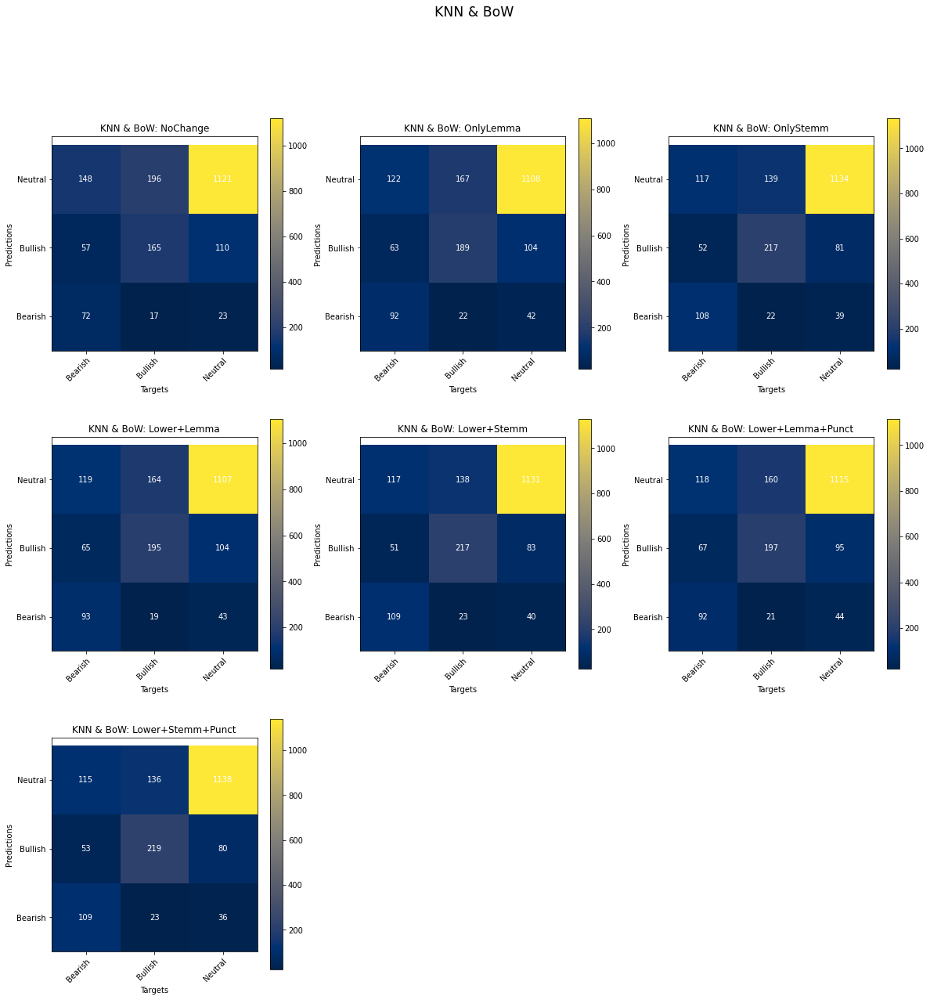

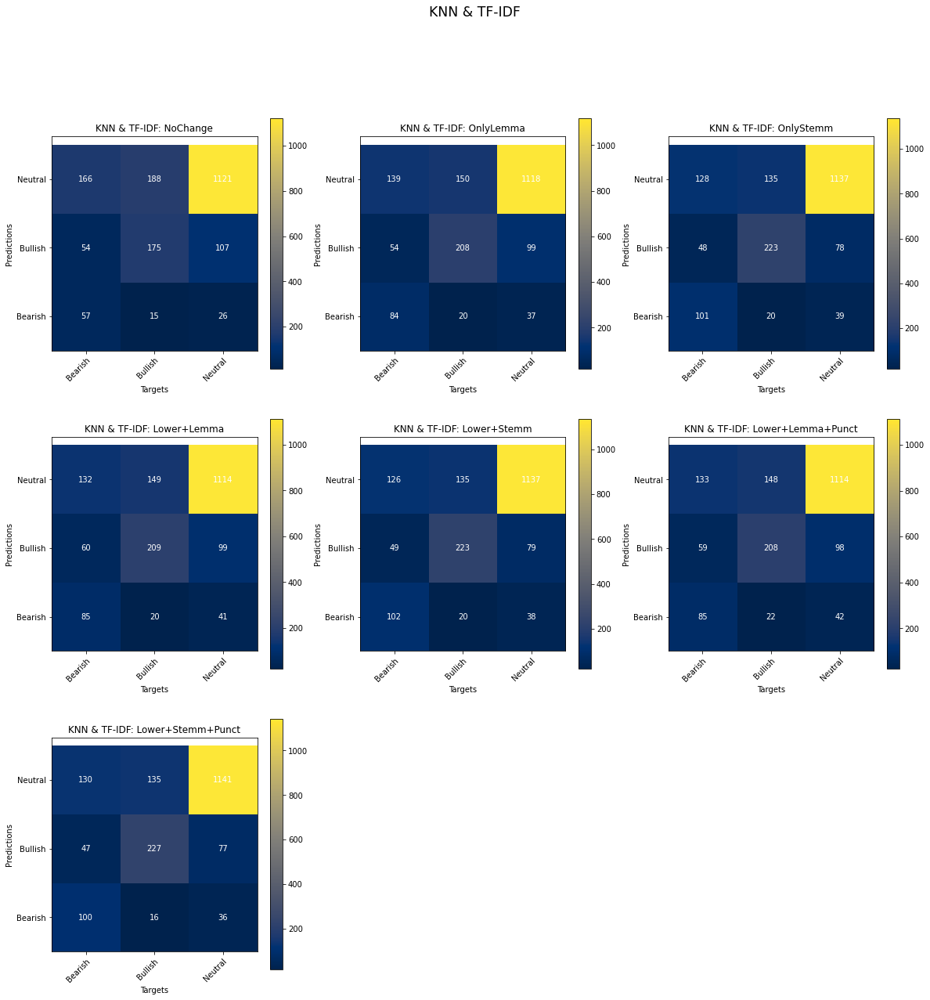

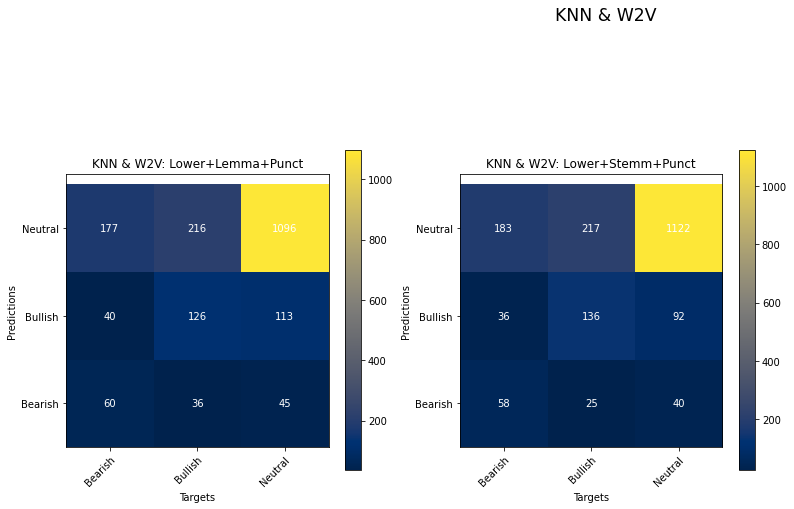

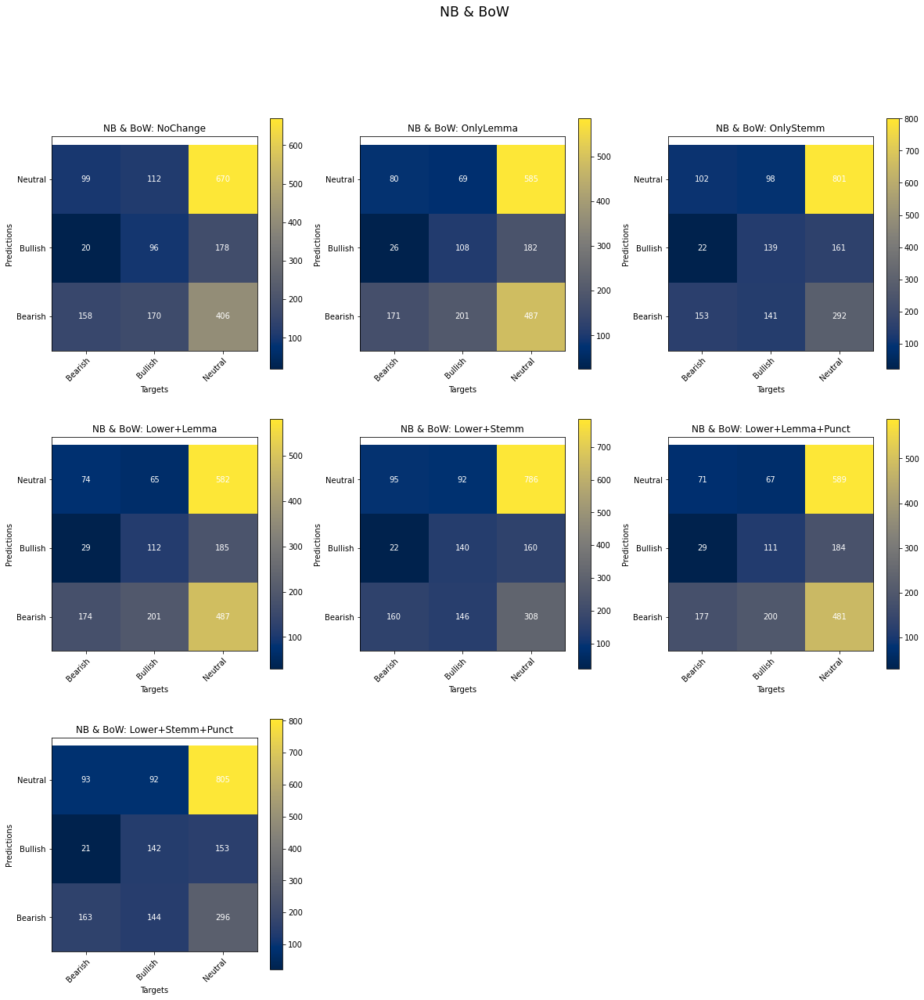

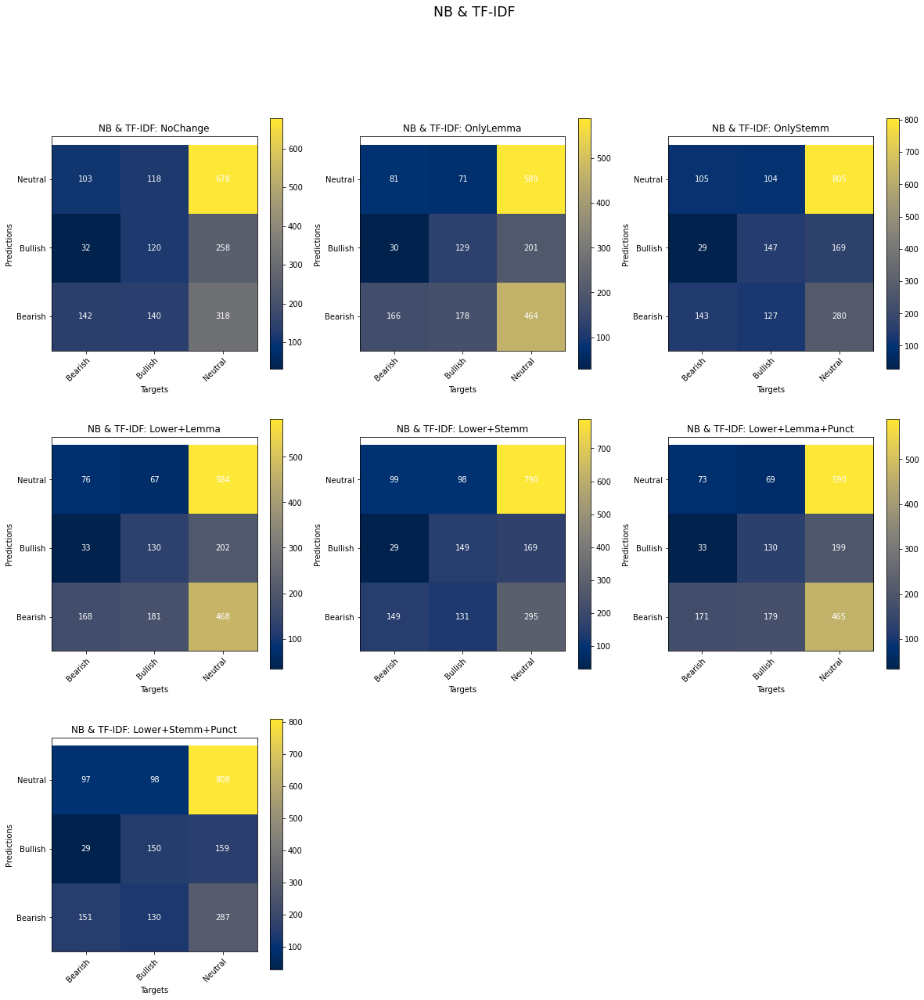

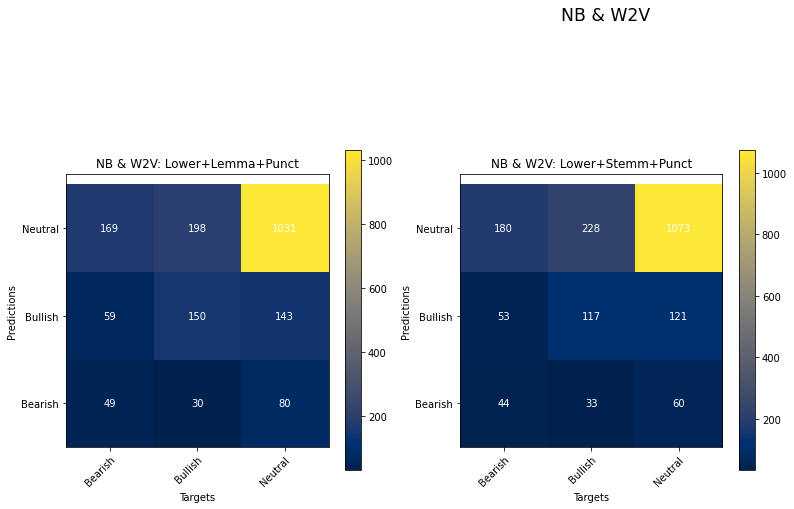

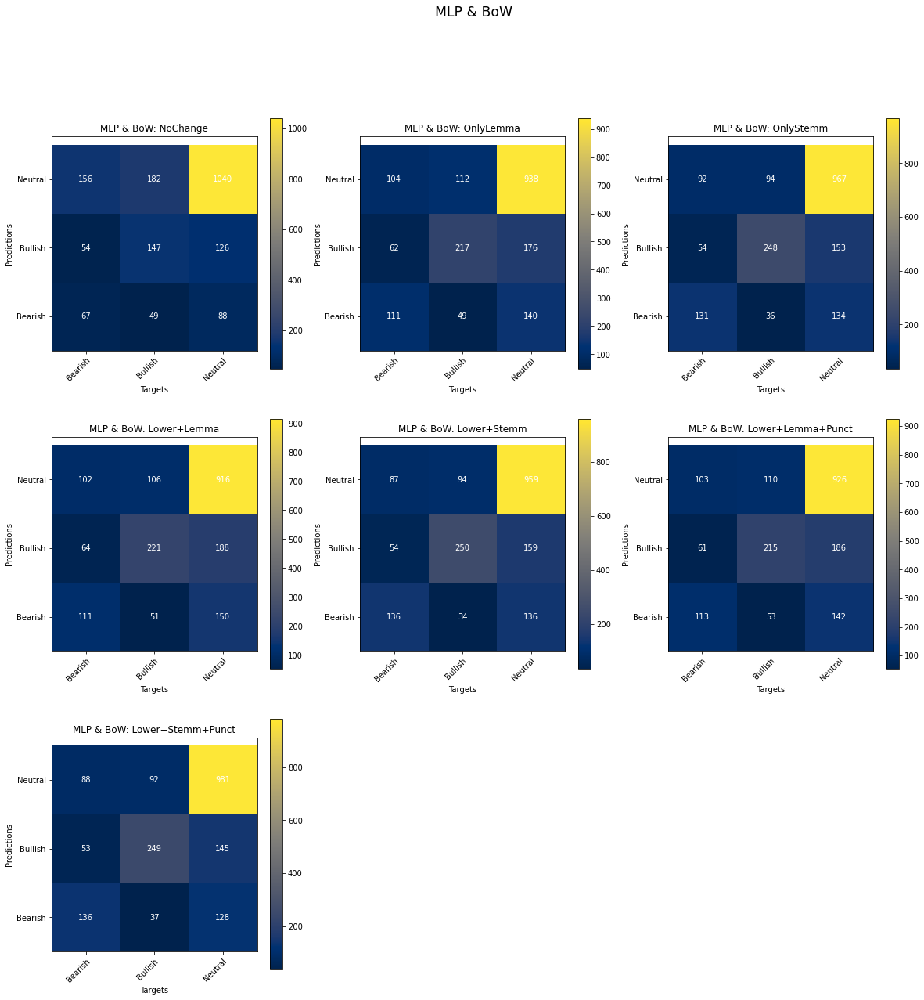

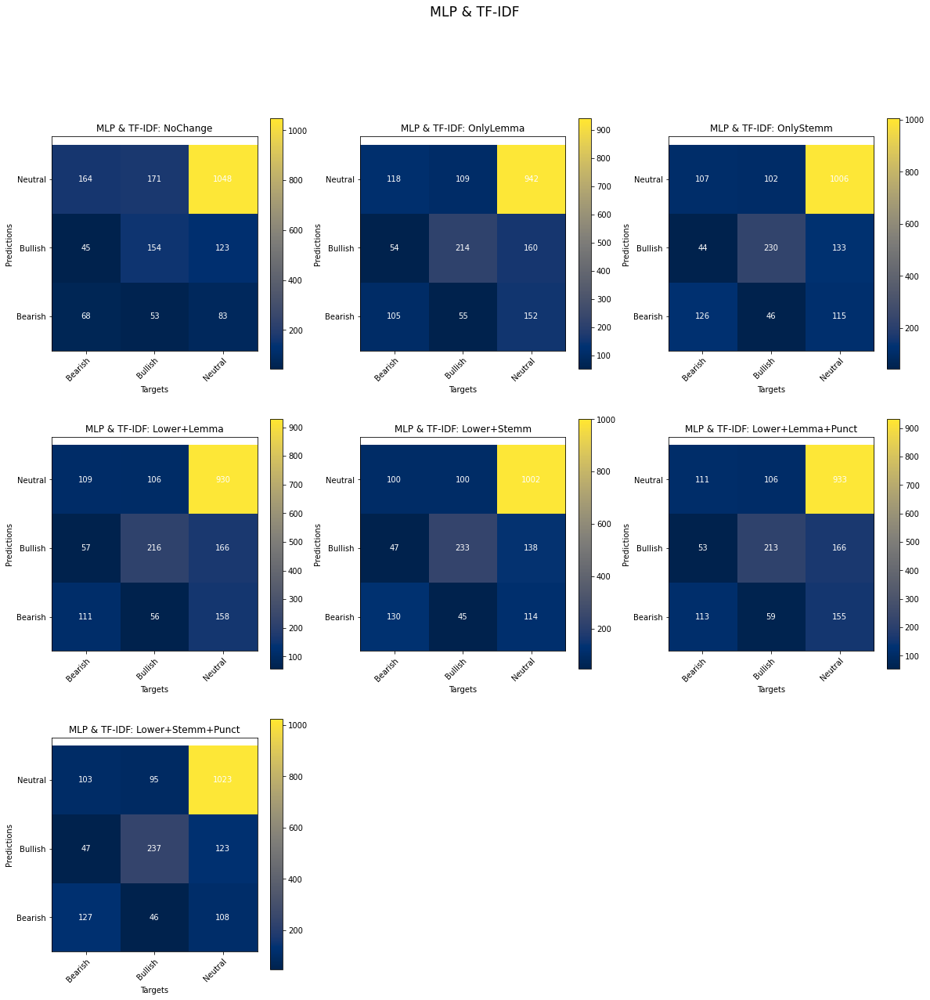

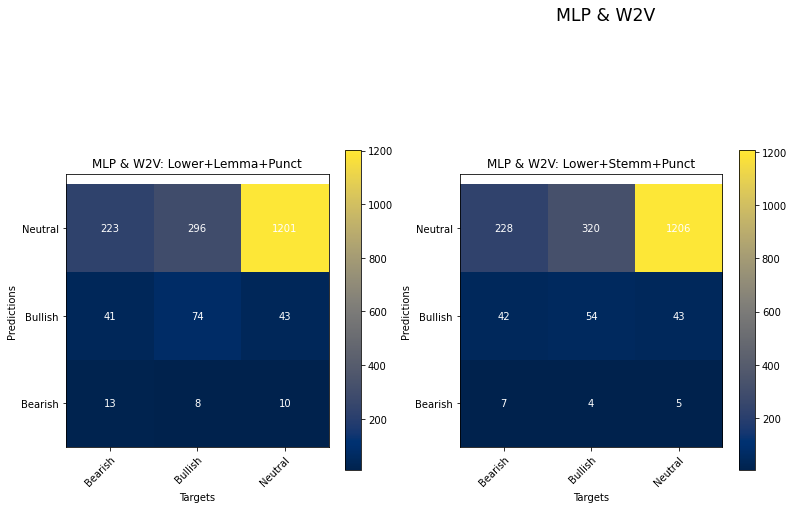

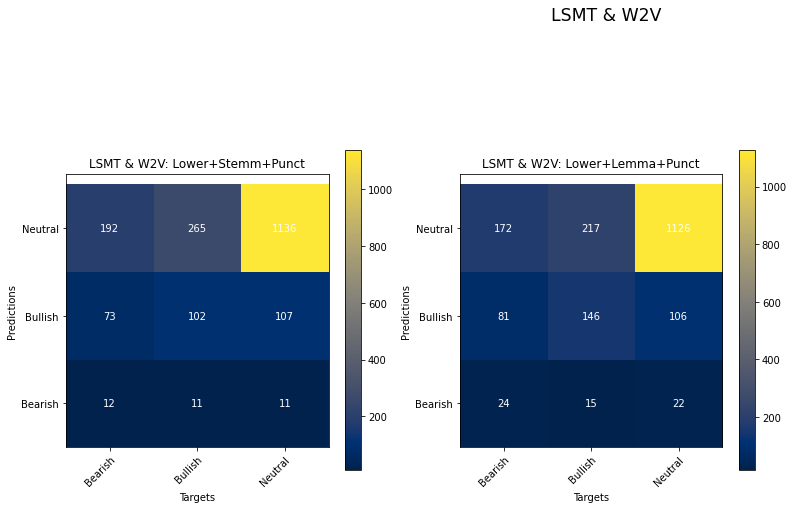

In [229]:
#Get all the confusion matrix plots
for prediction in different_predictions:

    fig= plt.figure(figsize=(20, 20))
    getCMPlots(prediction, labels, y_validation)
    fig.suptitle(list(prediction.keys())[0].split(':')[0], fontsize = 'xx-large')
    plt.show()

In [230]:
#Aggregates all the different predictions scores
def getAllScores(different_predictions):
    accuracy = []
    precision = []
    recall = []
    f1 = []
    index_names = []
    average_classification = []

    for prediction in different_predictions:
        
        for key,val in prediction.items():
            
            index_names.append(key)
            accuracy.append(metrics.accuracy_score(val, y_validation))
            precision.append(metrics.precision_score(val, y_validation, average = 'weighted'))
            recall.append(metrics.recall_score(val, y_validation, average = 'weighted'))
            f1.append(metrics.f1_score(val, y_validation, average = 'weighted'))
            average_classification.append((metrics.accuracy_score(val, y_validation)+
                                        metrics.precision_score(val, y_validation, average = 'weighted')+
                                        metrics.recall_score(val, y_validation, average = 'weighted')+
                                        metrics.f1_score(val, y_validation, average = 'weighted'))/4)
    
    #Build the dataframe
    data = {'Accuracy': accuracy, 'Precision': precision, 'Recall':recall, 'F1':f1, 'Average': average_classification}
    compare_metrics = pd.DataFrame(data, index = index_names)
    # Highlight the min and max values https://medium.com/gustavorsantos/how-to-highlight-max-min-or-nulls-with-pandas-f2df5bf4ccf9
    return compare_metrics.style\
        .format('{:.2f}')\
        .highlight_max(color = 'green')\
        .highlight_min(color = 'red')

In [231]:
#Get the aggregated metrics/scores dataframe
getAllScores(different_predictions)

,Accuracy,Precision,Recall,F1,Average
KNN & BoW: NoChange,0.71,0.78,0.71,0.74,0.73
KNN & BoW: OnlyLemma,0.73,0.77,0.73,0.74,0.74
KNN & BoW: OnlyStemm,0.76,0.80,0.76,0.78,0.78
KNN & BoW: Lower+Lemma,0.73,0.77,0.73,0.74,0.74
KNN & BoW: Lower+Stemm,0.76,0.80,0.76,0.78,0.77
KNN & BoW: Lower+Lemma+Punct,0.74,0.77,0.74,0.75,0.75
KNN & BoW: Lower+Stemm+Punct,0.77,0.80,0.77,0.78,0.78
KNN & TF-IDF: NoChange,0.71,0.78,0.71,0.74,0.73
KNN & TF-IDF: OnlyLemma,0.74,0.78,0.74,0.76,0.75
KNN & TF-IDF: OnlyStemm,0.77,0.80,0.77,0.78,0.78


## Observations: 
- NB + BoW gives the overall worst results
- KNN + TF-IDF gives the best results, and so we will use this to predict the test data
- MLP + W2V produce the highest precision, but fall short in everything else
- Not cleaning the text at all is almost always the worst out of its group, but not always. This may indicate we are removing something we shouldn't

## FINAL - Predict for Final Test corpus

In [246]:
test_lowerStemmPunct = clean(df_test, 
                           lower_case =True, 
                           remove_punct=True, 
                           apply_lemmatize=False, apply_stemmer=True)

100%|██████████| 2388/2388 [00:00<00:00, 8237.83it/s]


In [247]:
#Compare before and after for the several dataframes created

print('Initial tweet example:\n',df_test['text'][123])
print('Same example but after Lower+Stemm+Punct:\n',test_lowerStemmPunct['text'][123])


Initial tweet example:
 $ATRO - Astronics unveils universal radio field test solution https://t.co/diC9vddtwB
Same example but after Lower+Stemm+Punct:
 astron unveil univers radio field test solut


In [248]:
test_tfidf = tfidf.transform(test_lowerStemmPunct["text"])


In [249]:

predict_test = modelknnTFIDF_train_dict['Lower+Stemm+Punct'].predict(test_tfidf)


In [251]:
type(predict_test)

numpy.ndarray

In [253]:
test_predict_df = pd.DataFrame(data=predict_test, columns=['label'])  # 1st row as the column names

In [254]:
test_predict_df.to_csv('Predictions_004.csv')